In [503]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
%matplotlib inline

## EDA and Data Prep

In [504]:
xls = pd.ExcelFile('data (1).xlsx')
df_cs = pd.read_excel(xls, 'CS')
df_ts = pd.read_excel(xls, 'TS')
df_fs = pd.read_excel(xls, 'FS')

In [505]:
print(df_cs.columns)
print(df_ts.columns)
print(df_fs.columns)

Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'sand', 'Limestone', 'BSF',
       'Silica fume', 'water/binder', 'sp', 'fibre length', 'fibre volume (%)',
       'fibre elasticity', 'fibre dia (Um)', 'Aspect ratio ', 'fibre density',
       'Compressive Strength (Mpa)'],
      dtype='object')
Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'sand', 'Limestone', 'BSF',
       'Silica fume', 'water/binder', 'sp', 'fibre length', 'fibre volume (%)',
       'fibre elasticity', 'fibre dia (Um)', 'fibre density',
       'Tensile Strain Capacity (%)'],
      dtype='object')
Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'sand', 'Limestone', 'BSF',
       'Silica fume', 'water/binder', 'sp', 'fibre length', 'fibre volume (%)',
       'fibre elasticity', 'fibre dia (Um)', 'fibre density',
       'Flexural Strength (Mpa)'],
      dtype='object')


In [506]:
df_cs.isnull().sum()

Ref.                          144
S no                            0
Cement                          1
Fly ash C                       1
sand                            1
Limestone                       1
BSF                             1
Silica fume                     1
water/binder                    1
sp                             14
fibre length                    1
fibre volume (%)                1
fibre elasticity                1
fibre dia (Um)                  1
Aspect ratio                  421
fibre density                   1
Compressive Strength (Mpa)      1
dtype: int64

In [507]:
df_cs = df_cs.drop(['S no', 'Ref.', 'Aspect ratio '], axis=1)
df_cs[['sp']] = df_cs[['sp']].fillna(df_cs['sp'].mean())
df_cs = df_cs.dropna()
df_cs.isnull().sum()

Cement                        0
Fly ash C                     0
sand                          0
Limestone                     0
BSF                           0
Silica fume                   0
water/binder                  0
sp                            0
fibre length                  0
fibre volume (%)              0
fibre elasticity              0
fibre dia (Um)                0
fibre density                 0
Compressive Strength (Mpa)    0
dtype: int64

In [508]:
print(len(df_cs))

420


In [509]:
df_ts.isnull().sum()

Ref.                           130
S no                             0
Cement                           1
Fly ash C                        1
sand                             5
Limestone                        1
BSF                              1
Silica fume                      1
water/binder                     1
sp                               1
fibre length                     1
fibre volume (%)                 1
fibre elasticity                 1
fibre dia (Um)                   1
fibre density                    1
Tensile Strain Capacity (%)      1
dtype: int64

In [510]:
df_ts = df_ts.drop(['S no', 'Ref.'], axis=1)
df_ts[['sand']] = df_ts[['sand']].fillna(df_ts['sand'].mean())
df_ts = df_ts.dropna()
df_ts.isnull().sum()

Cement                         0
Fly ash C                      0
sand                           0
Limestone                      0
BSF                            0
Silica fume                    0
water/binder                   0
sp                             0
fibre length                   0
fibre volume (%)               0
fibre elasticity               0
fibre dia (Um)                 0
fibre density                  0
Tensile Strain Capacity (%)    0
dtype: int64

In [511]:
len(df_ts)

254

In [512]:
df_fs.isnull().sum()

Ref.                       126
S no                         0
Cement                       0
Fly ash C                    0
sand                         0
Limestone                    0
BSF                          0
Silica fume                  0
water/binder                 0
sp                           0
fibre length                 0
fibre volume (%)             0
fibre elasticity             0
fibre dia (Um)               0
fibre density                0
Flexural Strength (Mpa)      0
dtype: int64

In [513]:
df_fs = df_fs.drop(['Ref.', 'S no'], axis=1)

In [514]:
len(df_fs)

147

In [515]:
print(df_cs.nunique(), df_ts.nunique(), df_fs.nunique())

Cement                         15
Fly ash C                      69
sand                           95
Limestone                       7
BSF                             4
Silica fume                     6
water/binder                   66
sp                             97
fibre length                    7
fibre volume (%)               49
fibre elasticity               12
fibre dia (Um)                 11
fibre density                   8
Compressive Strength (Mpa)    191
dtype: int64 Cement                          14
Fly ash C                       50
sand                            73
Limestone                        8
BSF                              6
Silica fume                      6
water/binder                    65
sp                              80
fibre length                     6
fibre volume (%)                38
fibre elasticity                 7
fibre dia (Um)                   7
fibre density                    3
Tensile Strain Capacity (%)    128
dtype: int64 Cement  

In [516]:
cs_y = df_cs['Compressive Strength (Mpa)']
ts_y = df_ts['Tensile Strain Capacity (%)']
fs_y = df_fs['Flexural Strength (Mpa)']
cs_x, ts_x, fs_x = df_cs.drop(['Compressive Strength (Mpa)'], axis=1), df_ts.drop(['Tensile Strain Capacity (%)'], axis=1), df_fs.drop(['Flexural Strength (Mpa)'], axis=1)

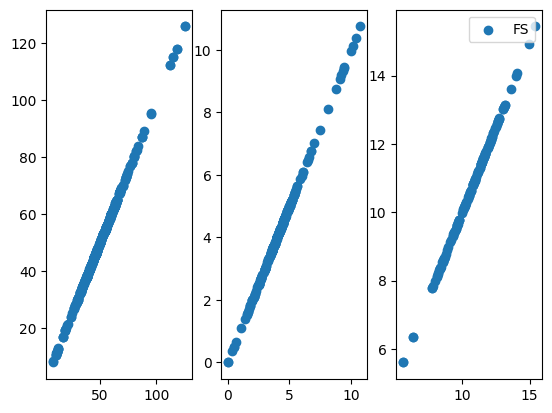

In [517]:
figure, ax = plt.subplots(1,3)
ax[0].scatter(cs_y, cs_y, label='CS')
ax[1].scatter(ts_y, ts_y, label='TS')
ax[2].scatter(fs_y, fs_y, label='FS')
plt.legend()

<Axes: >

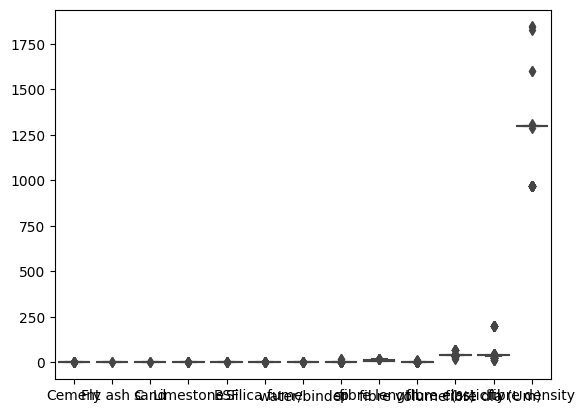

In [518]:
sns.boxplot(data=cs_x)

<Axes: >

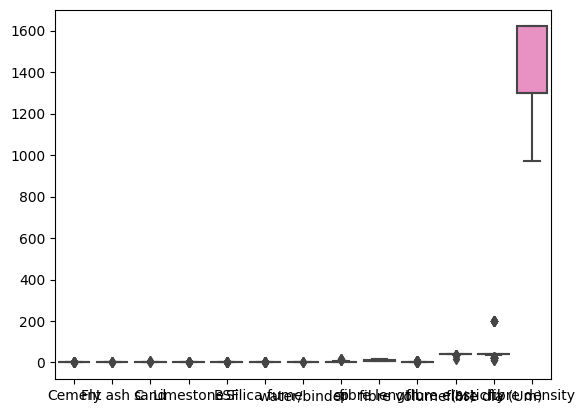

In [519]:
sns.boxplot(data=ts_x)

<Axes: >

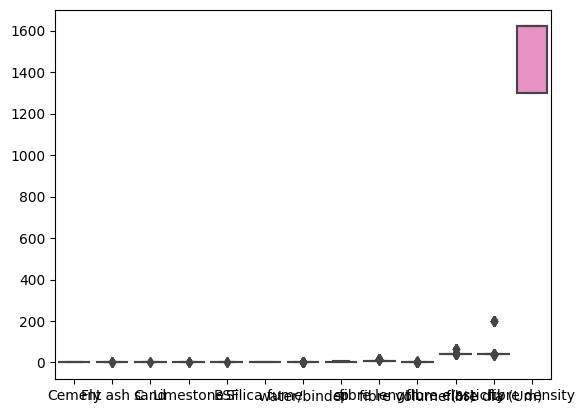

In [520]:
sns.boxplot(data=fs_x)

In [521]:
# bestfeatures = SelectKBest(score_func=f_regression, k=8)
# fit = bestfeatures.fit(cs_x,cs_y)
# dfscores = pd.DataFrame(fit.scores_)
# dfcolumns = pd.DataFrame(cs_x.columns)
# #concat two dataframes for better visualization 
# featureScores = pd.concat([dfcolumns,dfscores],axis=1)
# featureScores.columns = ['Specs','Score']  #naming the dataframe columns
# cols = featureScores.nlargest(8,'Score')['Specs'] #print 5 best features
# cs_x = cs_x[cols]

In [522]:
# bestfeatures = SelectKBest(score_func=f_regression, k=10)
# fit = bestfeatures.fit(ts_x,ts_y)
# dfscores = pd.DataFrame(fit.scores_)
# dfcolumns = pd.DataFrame(ts_x.columns)
# # concat two dataframes for better visualization 
# featureScores = pd.concat([dfcolumns,dfscores],axis=1)
# featureScores.columns = ['Specs','Score']  #naming the dataframe columns
# cols = featureScores.nlargest(8,'Score')['Specs'] #print 5 best features
# ts_x = ts_x[cols]

In [523]:
# bestfeatures = SelectKBest(score_func=f_regression, k=10)
# fit = bestfeatures.fit(fs_x,fs_y)
# dfscores = pd.DataFrame(fit.scores_)
# dfcolumns = pd.DataFrame(fs_x.columns)
# #concat two dataframes for better visualization 
# featureScores = pd.concat([dfcolumns,dfscores],axis=1)
# featureScores.columns = ['Specs','Score']  #naming the dataframe columns
# cols = featureScores.nlargest(8,'Score')['Specs'] #print 5 best features
# fs_x = fs_x[cols]

In [524]:
print(cs_x.shape, ts_x.shape, fs_x.shape)

(420, 13) (254, 13) (147, 13)


In [525]:
print(cs_y.shape, ts_y.shape, fs_y.shape)

(420,) (254,) (147,)


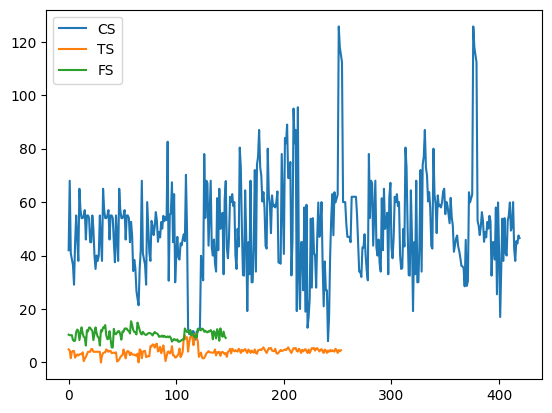

In [526]:
plt.plot(range(len(cs_y)), cs_y, label='CS')
plt.plot(range(len(ts_y)), ts_y, label='TS')
plt.plot(range(len(fs_y)), fs_y, label='FS')
plt.legend()

In [527]:
total_x = pd.concat([cs_x, ts_x, fs_x], axis=0)
total_x.shape

(821, 13)

<Axes: >

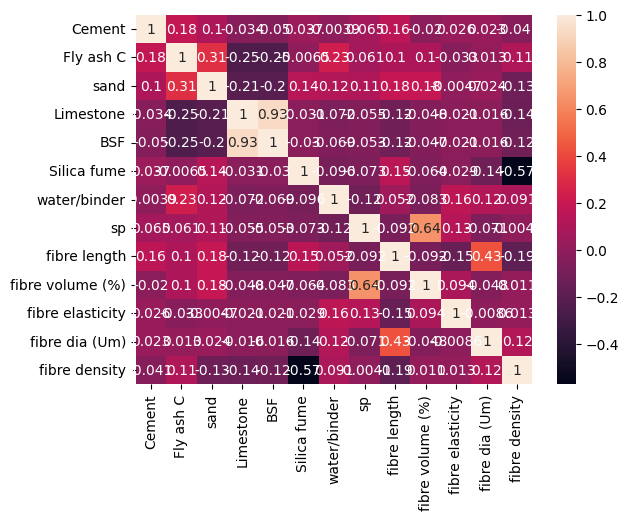

In [528]:
cs_corr = cs_x.corr()
sns.heatmap(cs_corr, annot=True)

<Axes: >

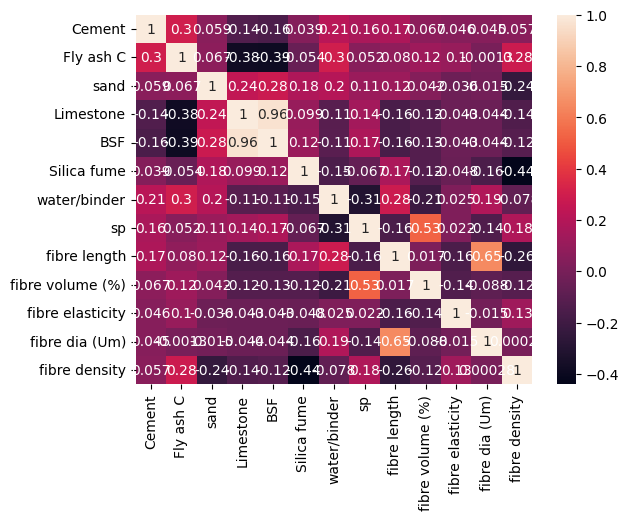

In [529]:
ts_corr = ts_x.corr()
sns.heatmap(ts_corr, annot=True)

<Axes: >

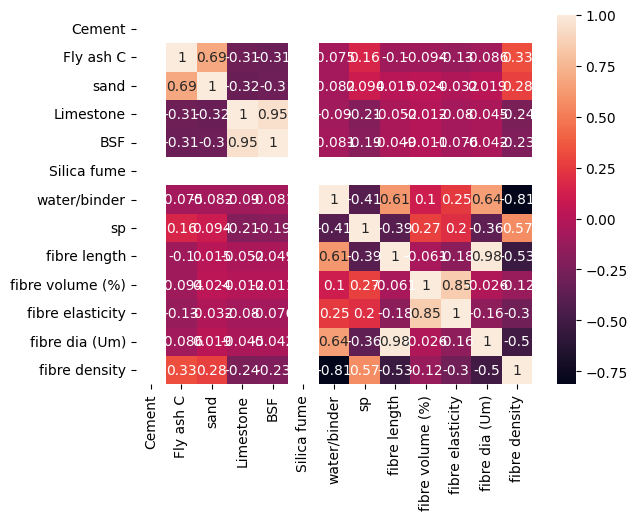

In [530]:
fs_corr = fs_x.corr()
sns.heatmap(fs_corr, annot=True)
# nan because values are constant

In [531]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
cs_x, ts_x, fs_x = min_max_scaler.fit_transform(cs_x), min_max_scaler.fit_transform(ts_x), min_max_scaler.fit_transform(fs_x)

In [532]:
cs_x_train, cs_x_test, cs_y_train, cs_y_test = train_test_split(cs_x, cs_y, random_state=42, test_size=0.2, shuffle=True)
print(cs_x_train.shape, cs_y_train.shape, cs_x_test.shape)

(336, 13) (336,) (84, 13)


In [533]:
ts_x_train, ts_x_test, ts_y_train, ts_y_test = train_test_split(ts_x, ts_y, random_state=42, test_size=0.2, shuffle=True)
print(ts_x_train.shape, ts_y_train.shape, ts_x_test.shape)

(203, 13) (203,) (51, 13)


In [534]:
fs_x_train, fs_x_test, fs_y_train, fs_y_test = train_test_split(fs_x, fs_y, random_state=42, test_size=0.2, shuffle=True)
print(fs_x_train.shape, fs_y_train.shape, fs_x_test.shape)

(117, 13) (117,) (30, 13)


## Models

In [535]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.model_selection import KFold, cross_val_score

final_preds = {'CS': [], 'TS': [], 'FS': []}

def pipeline(model, train_x, train_y, test_x, test_y, sheet_name):
    model.fit(train_x, train_y)
    pred_train = model.predict(train_x)
    pred_df = pd.DataFrame(pred_train, columns=[str(model)])
    pred_test = model.predict(test_x)
    plt.plot(train_y.values, train_y.values)
    plt.plot(1.2*train_y.values, train_y.values, '-')
    plt.plot(0.8*train_y.values, train_y.values, '-')
    plt.scatter(train_y.values, pred_train)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    print('Train r2: ', r2_score(train_y, pred_train))
    print('Train MAE: ', mean_absolute_error(train_y, pred_train))
    print('Train RMSE: ', np.sqrt(mean_squared_error(train_y, pred_train)))
    print('Test r2: ', r2_score(test_y, pred_test))
    print('Test MAE: ', mean_absolute_error(test_y, pred_test))
    print('Test RMSE: ', np.sqrt(mean_squared_error(test_y, pred_test)))
    print('Scatter Index:', np.sqrt(mean_squared_error(train_y, pred_train))/np.mean(pred_train)*100)

    cv = KFold(n_splits=5)
    scores = cross_val_score(model, train_x, train_y, scoring='neg_mean_absolute_error', cv=cv)
    print('K Fold MAE:', -np.mean(scores))

    figure, axis = plt.subplots(2, 1)
    figure.set_figheight(15)
    figure.set_figwidth(30)
    final_preds[sheet_name].append({str(model): pred_train})
    axis[0].plot(range(len(test_x)), pred_test, label='Pred')
    axis[0].plot(range(len(test_x)), test_y, label='Orig')

    axis[1].plot(range(len(train_x)), pred_train, label='Pred')
    axis[1].plot(range(len(train_x)), train_y, label='Orig')
    plt.legend()
    plt.title(str(model))


### Linear Regression

Actual: ['35.00 55.30 38.00 48.85 37.00']
Predicted: [27.47113265 48.05188714 38.71820172 46.8538157  51.18318458]
Train r2:  0.25513552578951204
Train MAE:  11.740985657879191
Train RMSE:  16.212259246260686
Test r2:  0.16141373499251055
Test MAE:  10.01844505805143
Test RMSE:  13.254225334437585
Scatter Index: 31.706793696401945
K Fold MAE: 12.130706644516646


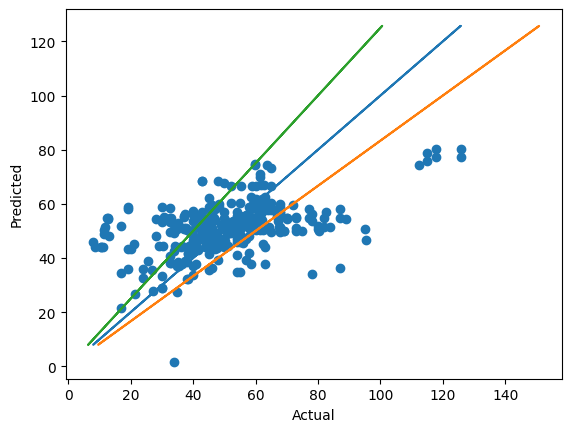

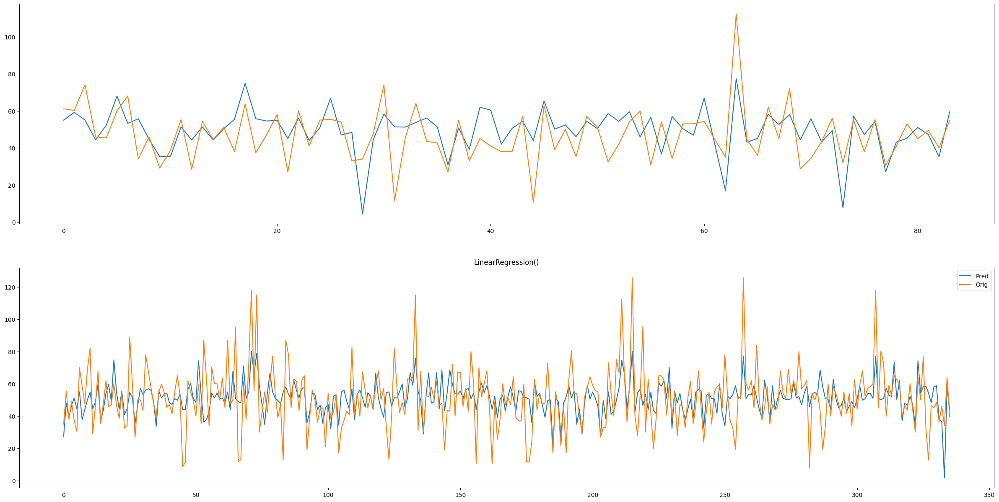

In [536]:
from sklearn.linear_model import LinearRegression
train_cs = pd.DataFrame(cs_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Actual: ['4.30 4.00 4.50 4.29 4.14']
Predicted: [3.55510215 3.57717391 5.65697174 2.56979657 4.3843133 ]
Train r2:  0.6886179826756976
Train MAE:  0.6851781599424692
Train RMSE:  0.9195930484918627
Test r2:  0.528294380500087
Test MAE:  0.9030921932193383
Test RMSE:  1.1614258753994475
Scatter Index: 21.922585093167374
K Fold MAE: 0.7428078914008776


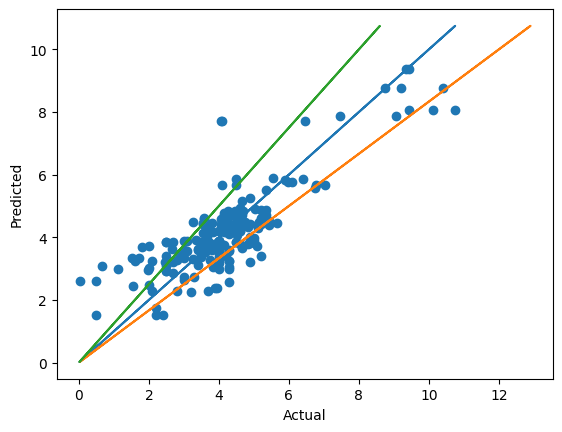

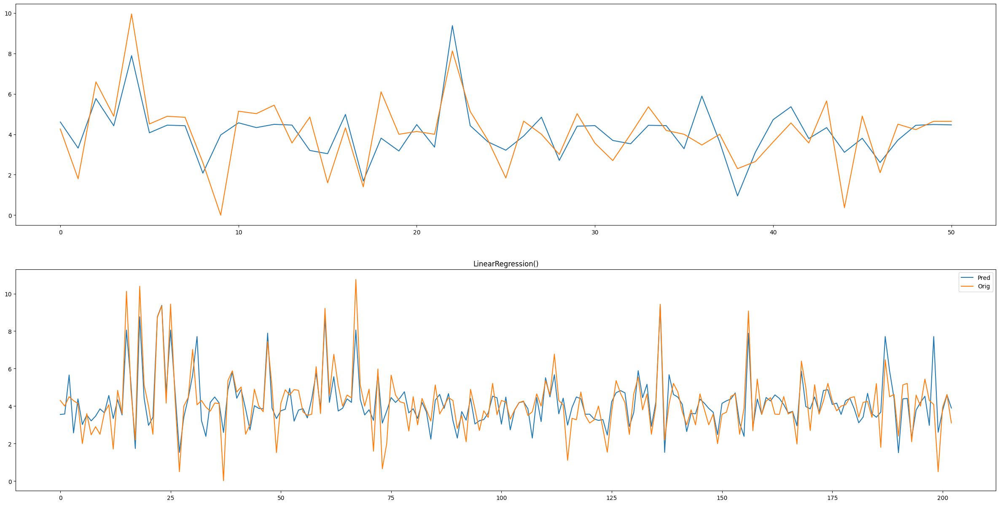

In [537]:
train_ts = pd.DataFrame(ts_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Actual: ['11.71 11.17  9.35  9.63  8.40']
Predicted: [11.44363354  9.81353963 10.7405481  10.26959086  7.77030707]
Train r2:  0.42708661685301796
Train MAE:  0.9838912666415169
Train RMSE:  1.2938126945810668
Test r2:  0.37326431477180577
Test MAE:  1.2472344728172255
Test RMSE:  1.4356103912222262
Scatter Index: 12.238146789281839
K Fold MAE: 1.2052738957003029


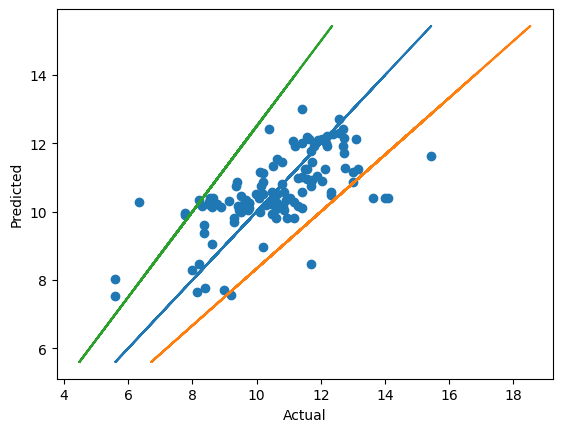

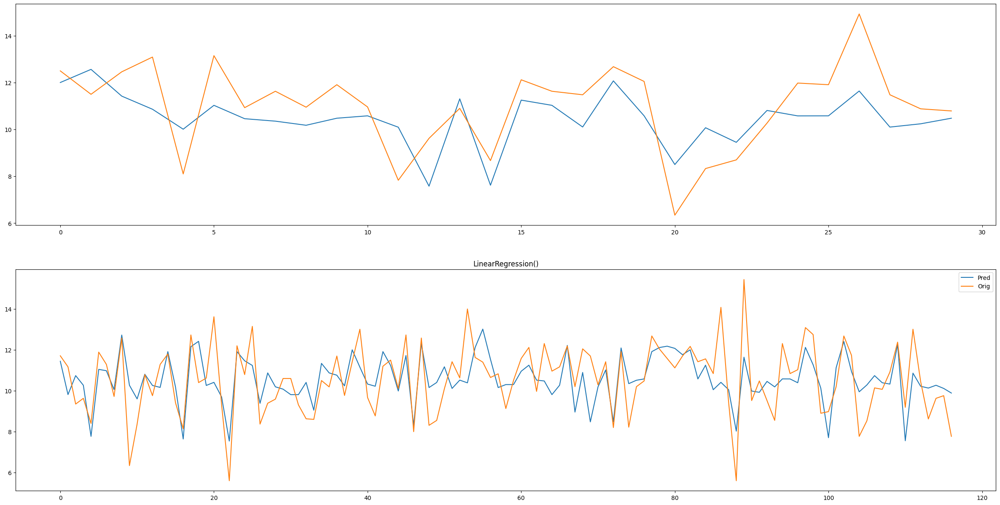

In [538]:
train_fs = pd.DataFrame(fs_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### Ridge Regression

Actual: ['35.00 55.30 38.00 48.85 37.00']
Predicted: [31.09240077 48.34737083 39.37526288 46.78244112 51.68086314]
Train r2:  0.24892859008121448
Train MAE:  11.699604672034067
Train RMSE:  16.279667271257985
Test r2:  0.18989793269033095
Test MAE:  9.748125318948036
Test RMSE:  13.027178006842766
Scatter Index: 31.83862555953753
K Fold MAE: 12.026600052140383


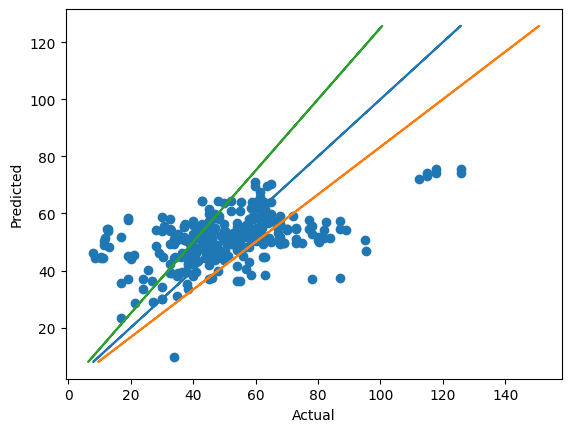

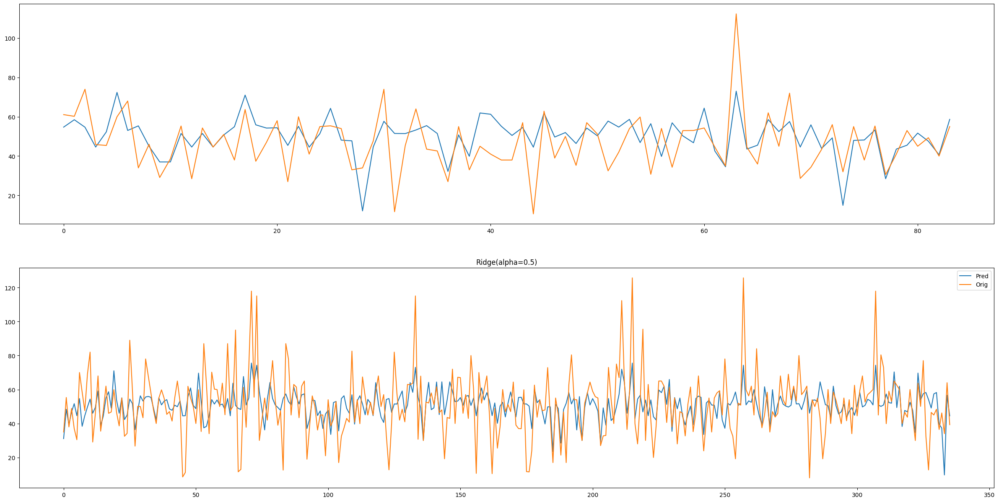

In [539]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=0.5)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Actual: ['4.30 4.00 4.50 4.29 4.14']
Predicted: [3.62306531 3.60810487 5.54563844 2.7474437  4.39125551]
Train r2:  0.6817287003014058
Train MAE:  0.6921129599830051
Train RMSE:  0.9297103258253314
Test r2:  0.5351570027189887
Test MAE:  0.8823345452264446
Test RMSE:  1.1529464032496473
Scatter Index: 22.163775338806886
K Fold MAE: 0.7399266986207407


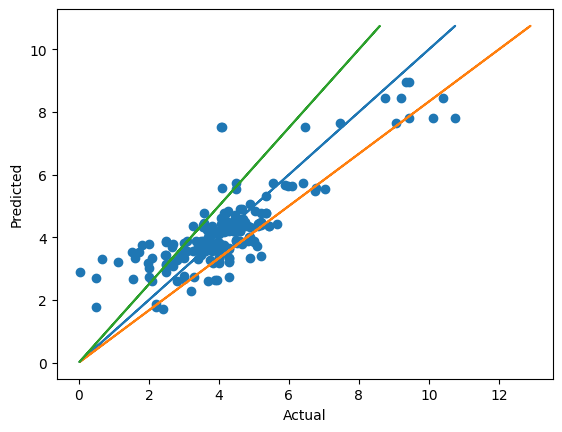

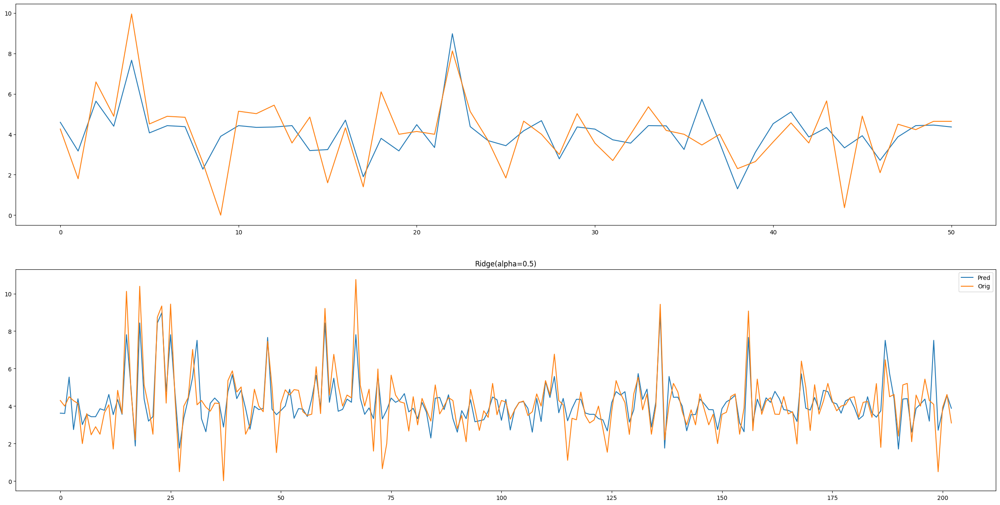

In [540]:
model = Ridge(alpha=0.5)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Actual: ['11.71 11.17  9.35  9.63  8.40']
Predicted: [11.36943689  9.91049305 10.87773158 10.28679666  9.55684571]
Train r2:  0.3523861312929588
Train MAE:  1.021545694376938
Train RMSE:  1.375577281703334
Test r2:  0.26518953599692063
Test MAE:  1.3416782208878404
Test RMSE:  1.5544689357601602
Scatter Index: 13.011556281674656
K Fold MAE: 1.1830744841543246


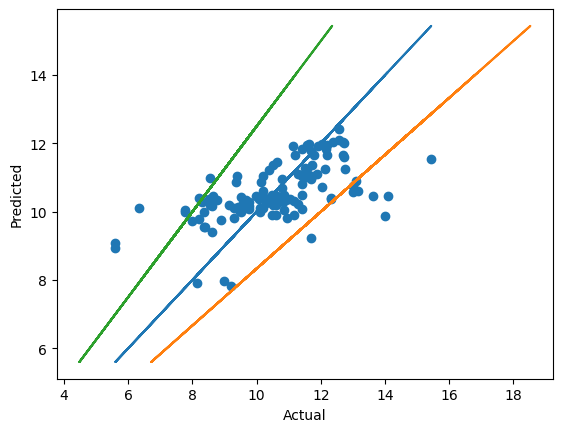

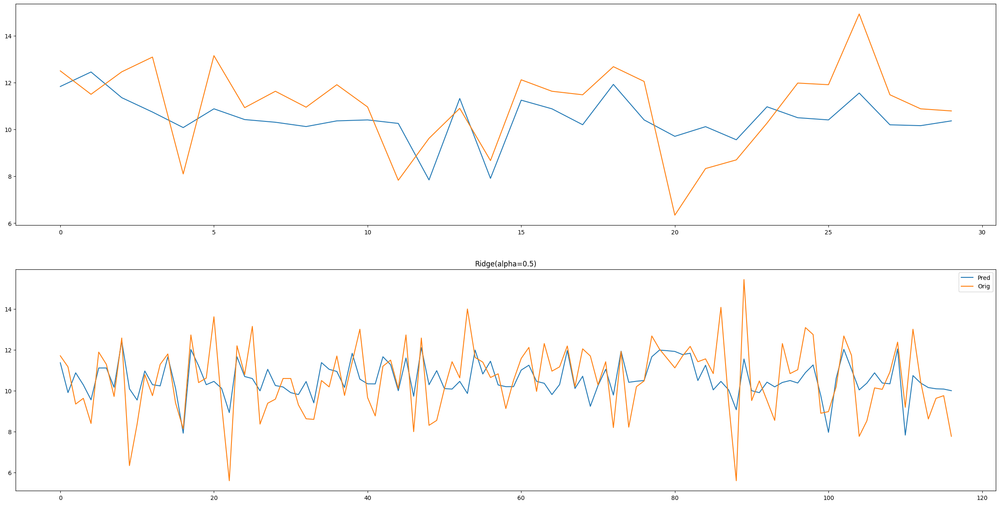

In [541]:
model = Ridge(alpha=0.5)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### Lasso Regression

Actual: ['35.00 55.30 38.00 48.85 37.00']
Predicted: [29.76395398 47.98097829 39.69174083 46.11097275 51.59574296]
Train r2:  0.24659923454106347
Train MAE:  11.772119195087644
Train RMSE:  16.30489242044016
Test r2:  0.1711682073673927
Test MAE:  9.96399308097879
Test RMSE:  13.17691298517605
Scatter Index: 31.88795912797685
K Fold MAE: 12.101106251831427


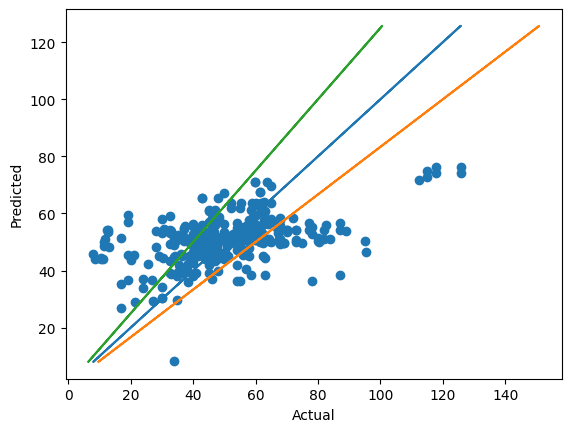

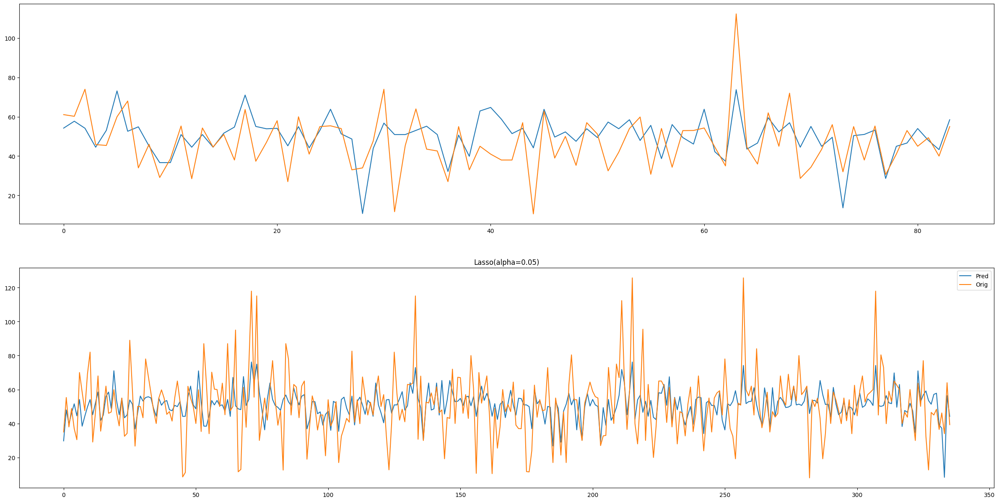

In [542]:
from sklearn.linear_model import Lasso

model = Lasso(alpha=0.05)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Actual: ['4.30 4.00 4.50 4.29 4.14']
Predicted: [3.8161342  3.60557742 5.43663598 2.75454651 4.42479459]
Train r2:  0.6718688467903229
Train MAE:  0.702903161132588
Train RMSE:  0.9440014210956839
Test r2:  0.5187442671645285
Test MAE:  0.9175836759107173
Test RMSE:  1.1731240287013494
Scatter Index: 22.504467074844552
K Fold MAE: 0.7534752689863726


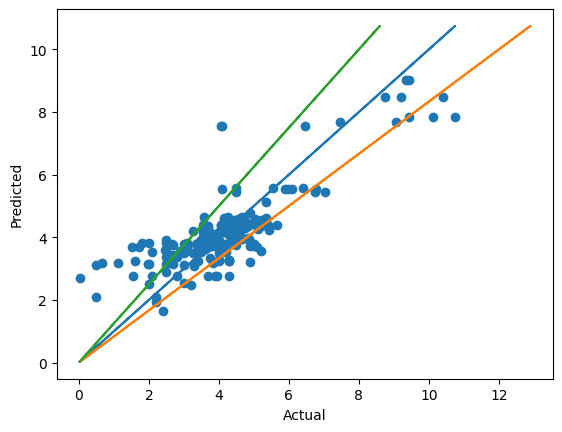

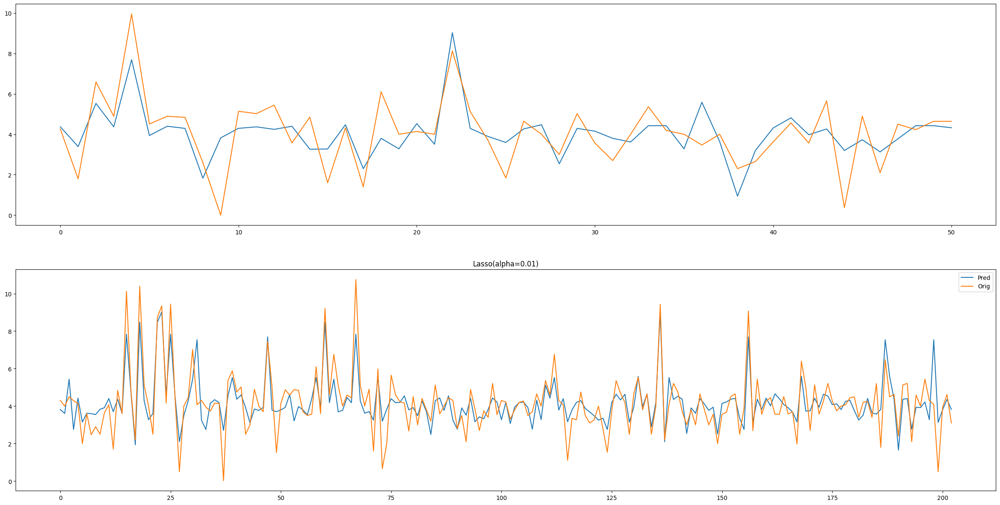

In [543]:
model = Lasso(alpha=0.01)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Actual: ['11.71 11.17  9.35  9.63  8.40']
Predicted: [11.45158795  9.82943861 10.75088116 10.39608647  7.98615585]
Train r2:  0.42525954137995947
Train MAE:  0.9862292185958503
Train RMSE:  1.2958740984854256
Test r2:  0.35569208649954864
Test MAE:  1.2650159939409327
Test RMSE:  1.455596873959181
Scatter Index: 12.257645565015913
K Fold MAE: 1.1844288653465802


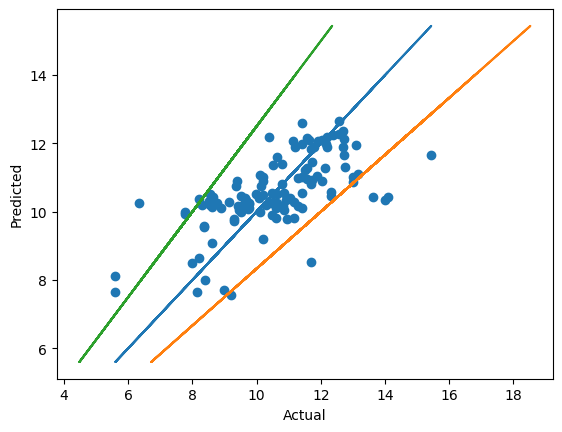

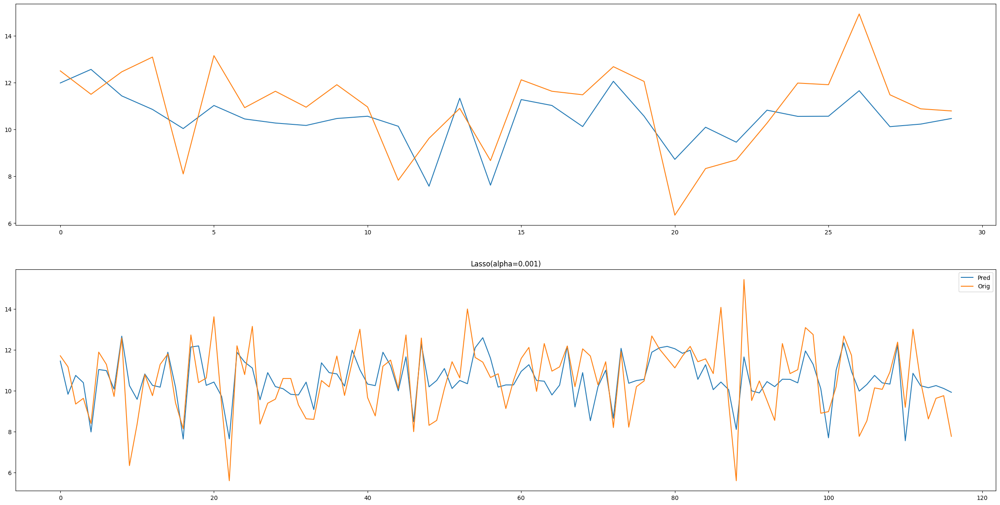

In [544]:
model = Lasso(alpha=0.001)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### Symbolic Regression

In [545]:
# from gplearn.genetic import SymbolicRegressor

# function_set = ['add', 'sub', 'mul', 'div','cos','sin','neg','inv']
# est_gp = SymbolicRegressor(population_size=5000,function_set=function_set,
#                            generations=40, stopping_criteria=0.01,
#                            p_crossover=0.7, p_subtree_mutation=0.1,
#                            p_hoist_mutation=0.05, p_point_mutation=0.1,
#                            max_samples=0.9, verbose=1,
#                            parsimony_coefficient=0.01, random_state=0)
# converter = {
#     'sub': lambda x, y : x - y,
#     'div': lambda x, y : x/y,
#     'mul': lambda x, y : x*y,
#     'add': lambda x, y : x + y,
#     'neg': lambda x    : -x,
#     'pow': lambda x, y : x**y,
#     'sin': lambda x    : sin(x),
#     'cos': lambda x    : cos(x),
#     'inv': lambda x: 1/x,
#     'sqrt': lambda x: x**0.5,
#     'pow3': lambda x: x**3
# }

# est_gp.fit(cs_x_train, cs_y_train)
# print('R2:',est_gp.score(cs_x_test,cs_y_test))

In [546]:
# from sympy import *
# next_e = sympify((est_gp._program), locals=converter)
# next_e

In [547]:
# preds = est_gp.predict(cs_x_test)
# plt.plot(range(len(cs_x_test)), preds, label='Pred')
# plt.plot(range(len(cs_x_test)), cs_y_test, label='Orig')
# plt.legend()
# plt.title(str(model))

### Decision Tree Regressor

Actual: ['35.00 55.30 38.00 48.85 37.00']
Predicted: [45.96724138 45.96724138 36.46015385 54.19976077 39.11636364]
Train r2:  0.4393041076736238
Train MAE:  10.509536168711305
Train RMSE:  14.065934682110447
Test r2:  -0.062414269075067974
Test MAE:  11.084354727244927
Test RMSE:  14.918577844613337
Scatter Index: 27.509163426165156
K Fold MAE: 12.605629978438317


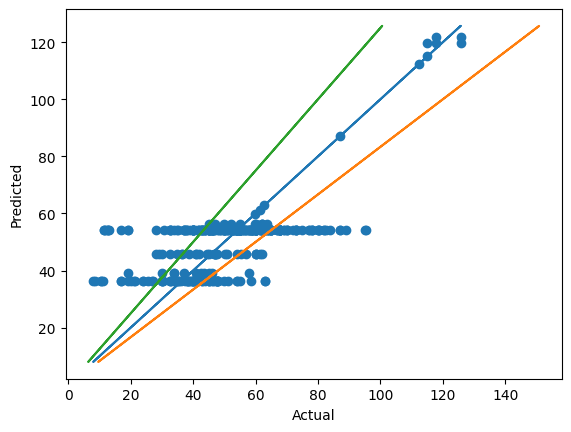

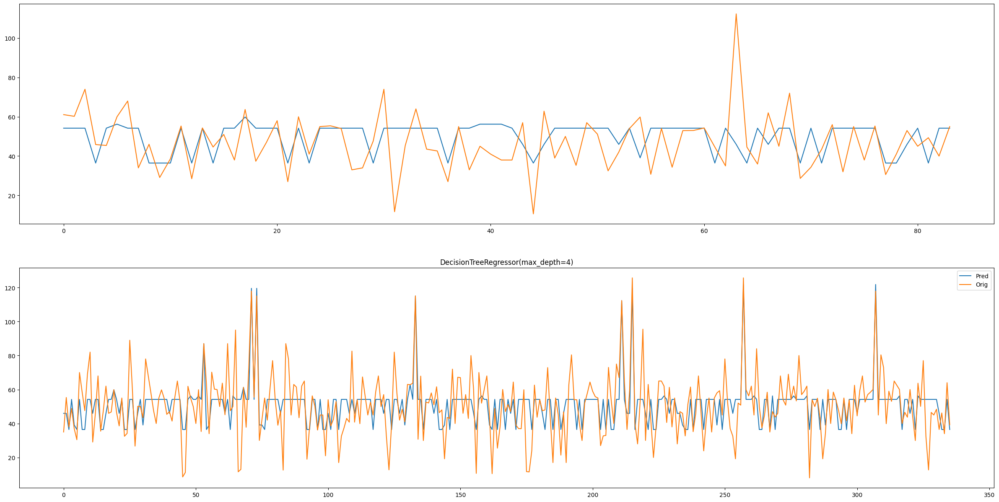

In [548]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(max_depth = 4)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

In [549]:
from sklearn import tree
text_representation = tree.export_text(model)
print(text_representation)


|--- feature_2 <= 0.21
|   |--- feature_8 <= 0.96
|   |   |--- feature_12 <= 0.18
|   |   |   |--- feature_7 <= 0.14
|   |   |   |   |--- value: [56.23]
|   |   |   |--- feature_7 >  0.14
|   |   |   |   |--- value: [119.57]
|   |   |--- feature_12 >  0.18
|   |   |   |--- feature_10 <= 0.44
|   |   |   |   |--- value: [39.12]
|   |   |   |--- feature_10 >  0.44
|   |   |   |   |--- value: [54.20]
|   |--- feature_8 >  0.96
|   |   |--- feature_1 <= 0.23
|   |   |   |--- feature_7 <= 0.00
|   |   |   |   |--- value: [121.81]
|   |   |   |--- feature_7 >  0.00
|   |   |   |   |--- value: [115.08]
|   |   |--- feature_1 >  0.23
|   |   |   |--- value: [59.88]
|--- feature_2 >  0.21
|   |--- feature_8 <= 0.96
|   |   |--- feature_6 <= 0.71
|   |   |   |--- feature_1 <= 0.37
|   |   |   |   |--- value: [45.97]
|   |   |   |--- feature_1 >  0.37
|   |   |   |   |--- value: [36.46]
|   |   |--- feature_6 >  0.71
|   |   |   |--- value: [87.00]
|   |--- feature_8 >  0.96
|   |   |--- feature_

Actual: ['4.30 4.00 4.50 4.29 4.14']
Predicted: [3.92603175 2.94912281 5.76       3.92603175 4.53611111]
Train r2:  0.7380067484465987
Train MAE:  0.6344783633961751
Train RMSE:  0.8435172494574782
Test r2:  0.4924048818170932
Test MAE:  0.8858004815961472
Test RMSE:  1.2047992560973544
Scatter Index: 20.10898049861638
K Fold MAE: 0.7477926939833377


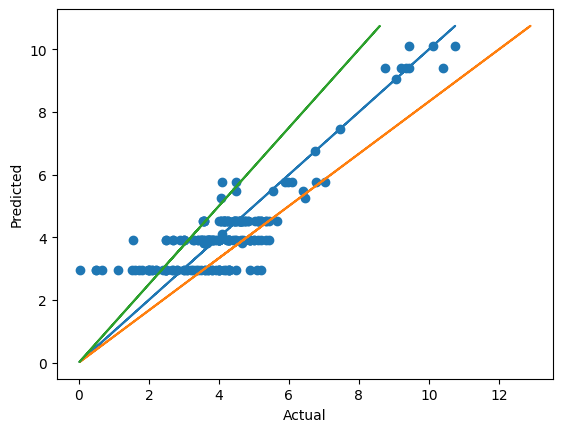

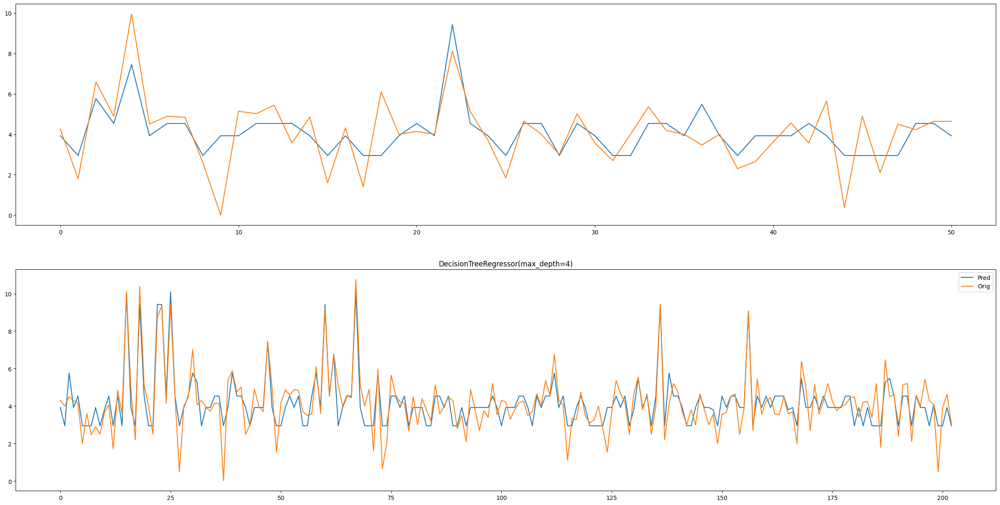

In [550]:
model = DecisionTreeRegressor(max_depth = 4)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

In [551]:
text_representation = tree.export_text(model)
print(text_representation)

|--- feature_5 <= 0.62
|   |--- feature_11 <= 0.57
|   |   |--- feature_12 <= 0.75
|   |   |   |--- feature_9 <= 0.15
|   |   |   |   |--- value: [2.95]
|   |   |   |--- feature_9 >  0.15
|   |   |   |   |--- value: [3.93]
|   |   |--- feature_12 >  0.75
|   |   |   |--- feature_1 <= 0.95
|   |   |   |   |--- value: [4.54]
|   |   |   |--- feature_1 >  0.95
|   |   |   |   |--- value: [3.80]
|   |--- feature_11 >  0.57
|   |   |--- feature_2 <= 0.15
|   |   |   |--- feature_2 <= 0.12
|   |   |   |   |--- value: [5.48]
|   |   |   |--- feature_2 >  0.12
|   |   |   |   |--- value: [5.77]
|   |   |--- feature_2 >  0.15
|   |   |   |--- feature_1 <= 0.43
|   |   |   |   |--- value: [5.76]
|   |   |   |--- feature_1 >  0.43
|   |   |   |   |--- value: [6.76]
|--- feature_5 >  0.62
|   |--- feature_2 <= 0.23
|   |   |--- feature_2 <= 0.16
|   |   |   |--- feature_7 <= 0.00
|   |   |   |   |--- value: [9.42]
|   |   |   |--- feature_7 >  0.00
|   |   |   |   |--- value: [10.10]
|   |   |--- 

Actual: ['11.71 11.17  9.35  9.63  8.40']
Predicted: [11.10512821 10.67166667 11.10512821 11.10512821  9.        ]
Train r2:  0.6613871282821892
Train MAE:  0.7275742633434941
Train RMSE:  0.9946691670288699
Test r2:  0.5015730721373785
Test MAE:  0.9390215617715624
Test RMSE:  1.280251018972353
Scatter Index: 9.408554517865163
K Fold MAE: 1.2507834310726926


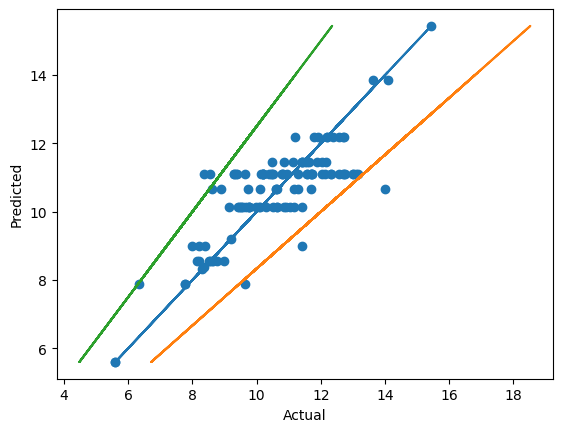

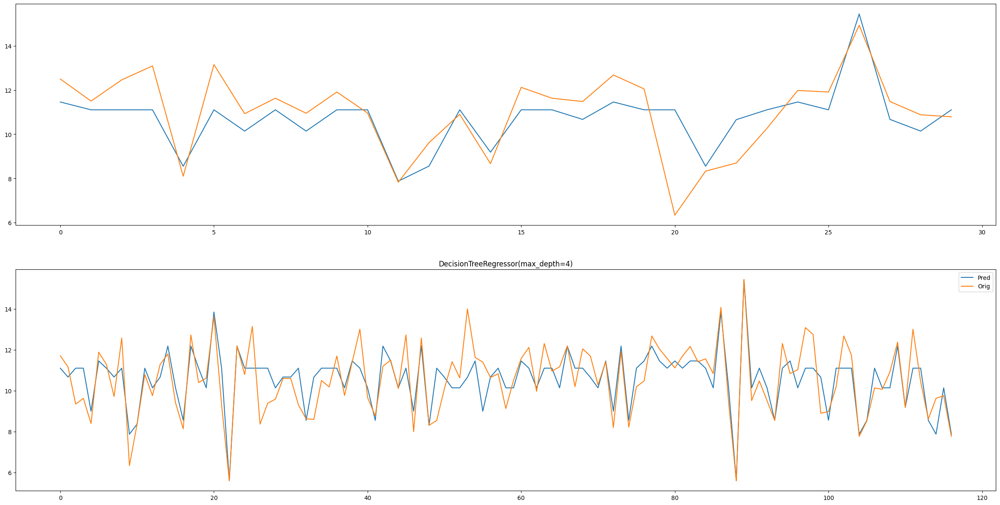

In [552]:
model = DecisionTreeRegressor(max_depth = 4)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

In [553]:
text_representation = tree.export_text(model)
print(text_representation)

|--- feature_2 <= 0.56
|   |--- feature_7 <= 0.62
|   |   |--- feature_9 <= 0.36
|   |   |   |--- feature_11 <= 0.00
|   |   |   |   |--- value: [9.00]
|   |   |   |--- feature_11 >  0.00
|   |   |   |   |--- value: [11.11]
|   |   |--- feature_9 >  0.36
|   |   |   |--- feature_9 <= 0.56
|   |   |   |   |--- value: [5.60]
|   |   |   |--- feature_9 >  0.56
|   |   |   |   |--- value: [10.66]
|   |--- feature_7 >  0.62
|   |   |--- feature_6 <= 0.23
|   |   |   |--- feature_7 <= 0.84
|   |   |   |   |--- value: [11.46]
|   |   |   |--- feature_7 >  0.84
|   |   |   |   |--- value: [12.19]
|   |   |--- feature_6 >  0.23
|   |   |   |--- feature_2 <= 0.48
|   |   |   |   |--- value: [15.44]
|   |   |   |--- feature_2 >  0.48
|   |   |   |   |--- value: [13.85]
|--- feature_2 >  0.56
|   |--- feature_6 <= 0.23
|   |   |--- feature_2 <= 0.83
|   |   |   |--- feature_7 <= 0.39
|   |   |   |   |--- value: [10.67]
|   |   |   |--- feature_7 >  0.39
|   |   |   |   |--- value: [10.14]
|   |   

### Random Forest

Actual: ['35.00 55.30 38.00 48.85 37.00']
Predicted: [38.57347099 51.10658097 39.82896989 51.88439065 38.4641299 ]
Train r2:  0.752083410930992
Train MAE:  6.665285227210776
Train RMSE:  9.35314577496117
Test r2:  0.3137119654238152
Test MAE:  8.782225796924436
Test RMSE:  11.990400535034375
Scatter Index: 18.290840522456453
K Fold MAE: 10.230433056804738


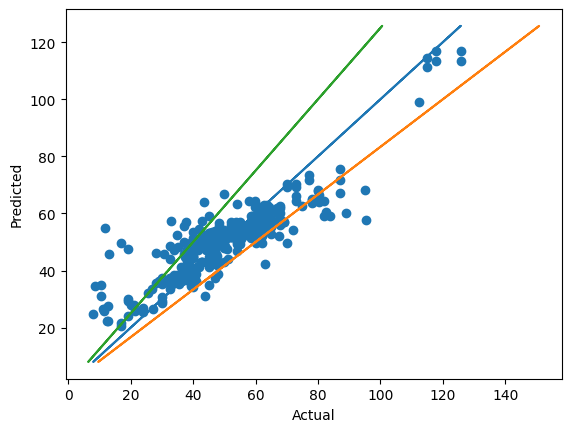

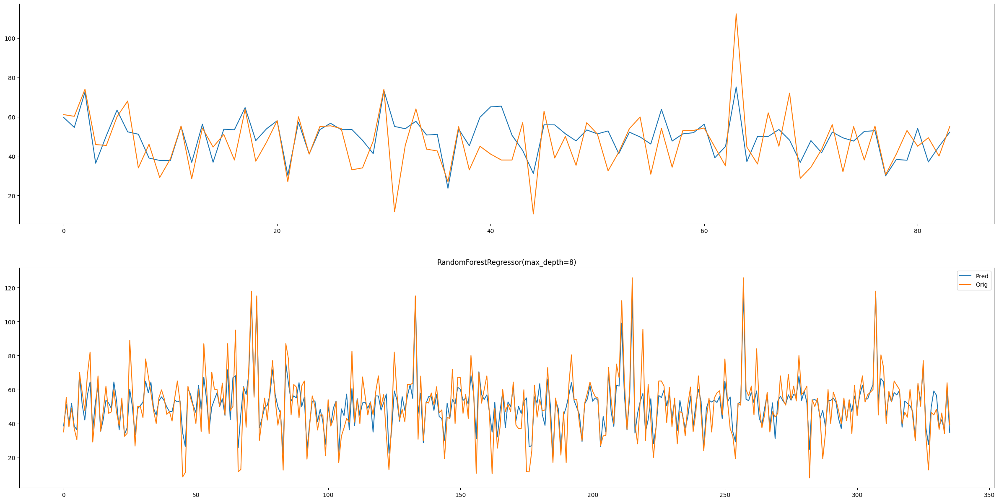

In [554]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_depth = 8)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

In [555]:
pickle.dump(model, open('cs.sav', 'wb'))

Actual: ['4.30 4.00 4.50 4.29 4.14']
Predicted: [4.04605357 3.94866136 5.7610775  3.64197881 4.48038206]
Train r2:  0.905370365814904
Train MAE:  0.3726863690738056
Train RMSE:  0.5069469287165673
Test r2:  0.6046066776927627
Test MAE:  0.7658711948715592
Test RMSE:  1.0633362940673583
Scatter Index: 12.039436875101273
K Fold MAE: 0.633087657703396


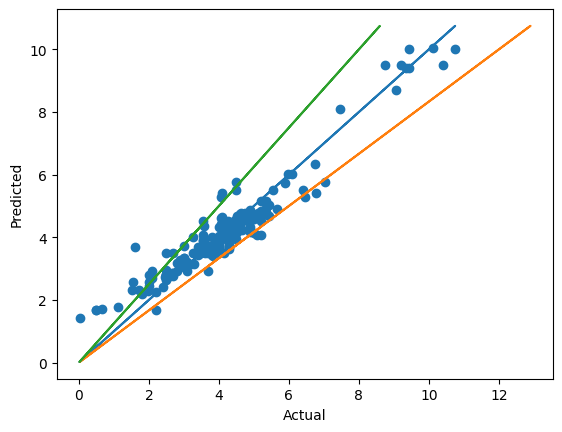

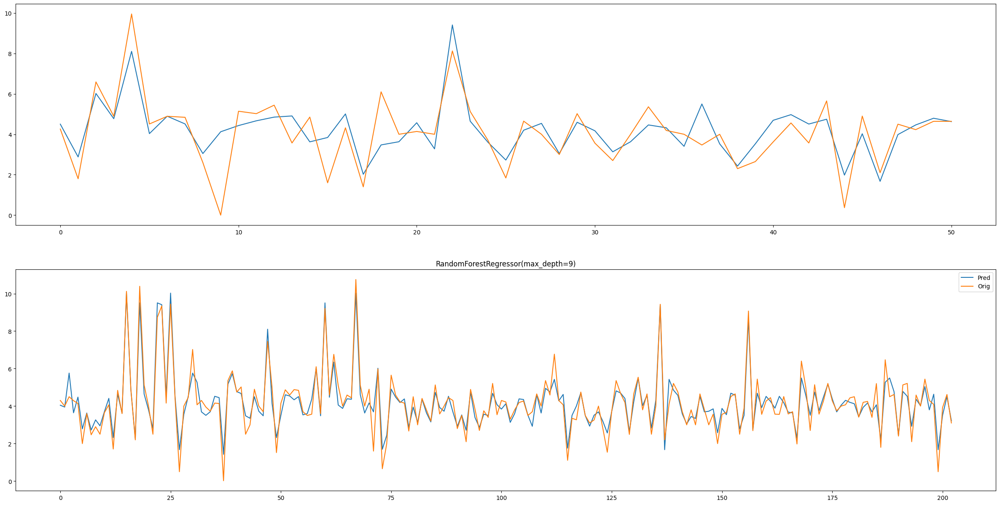

In [556]:
model = RandomForestRegressor(max_depth = 9)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

In [557]:
pickle.dump(model, open('ts.sav', 'wb'))

Actual: ['11.71 11.17  9.35  9.63  8.40']
Predicted: [11.73837603 10.82857929 10.14002355  9.49396151  8.46532667]
Train r2:  0.8742018937842515
Train MAE:  0.4609678248579084
Train RMSE:  0.6062670646811432
Test r2:  0.7033441846200585
Test MAE:  0.7987105753515781
Test RMSE:  0.9876903591456134
Scatter Index: 5.7377204629915415
K Fold MAE: 0.9649761020217011


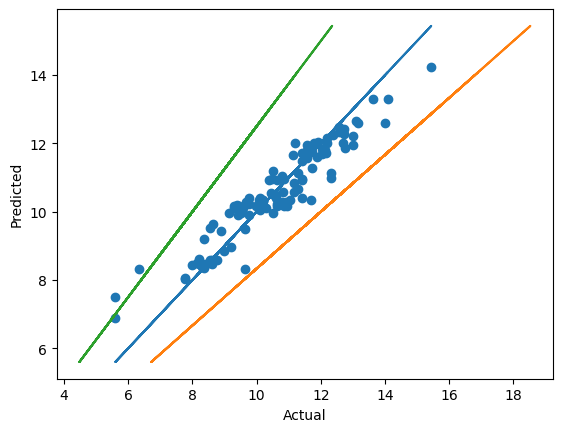

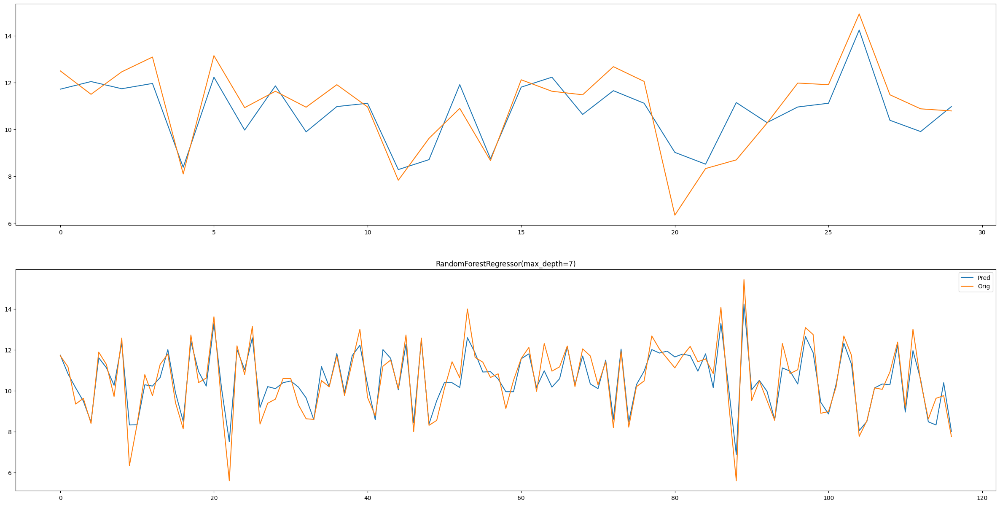

In [558]:
model = RandomForestRegressor(max_depth = 7)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

In [559]:
pickle.dump(model, open('fs.sav', 'wb'))

### SVR

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.016 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.008 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.001 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.000 total time=   0.0s
[CV 5/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.003 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.002 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.003 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.016 total time=   0.0s
[CV 4/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.011 total time=   0.0s
[CV 5/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.013 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.000 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

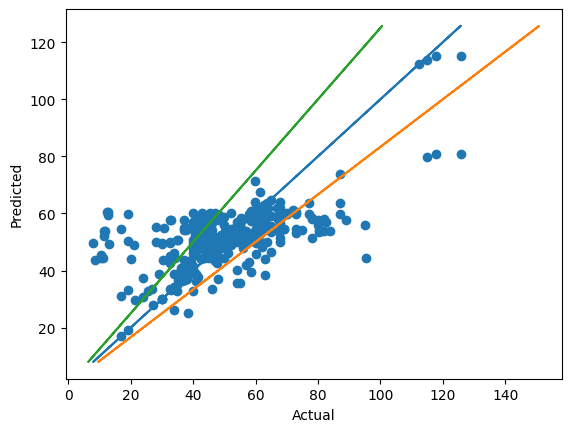

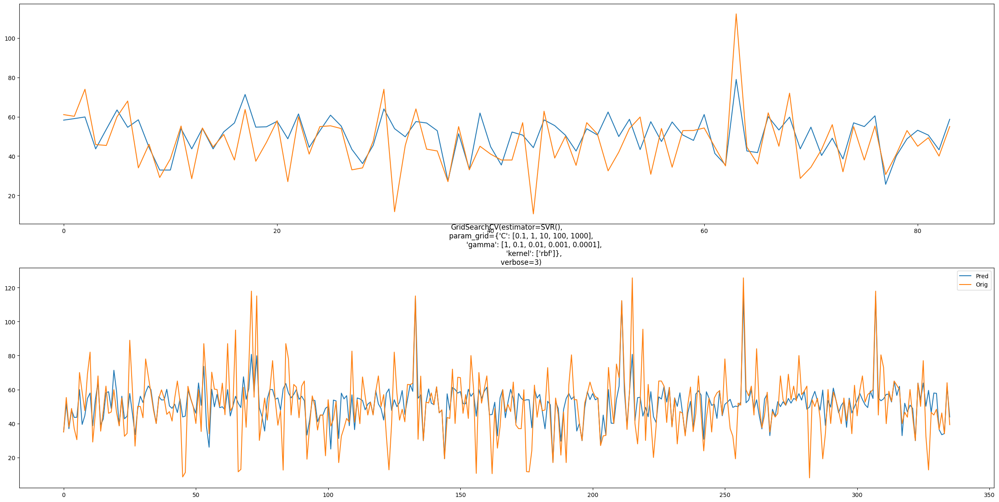

In [560]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.084 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.093 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.243 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.214 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.228 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.025 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.032 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.038 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.046 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.077 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.028 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

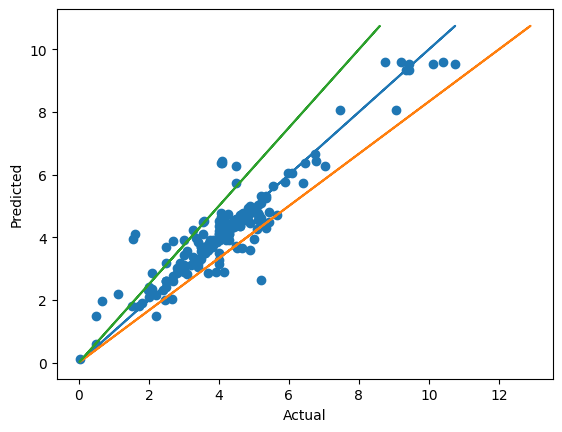

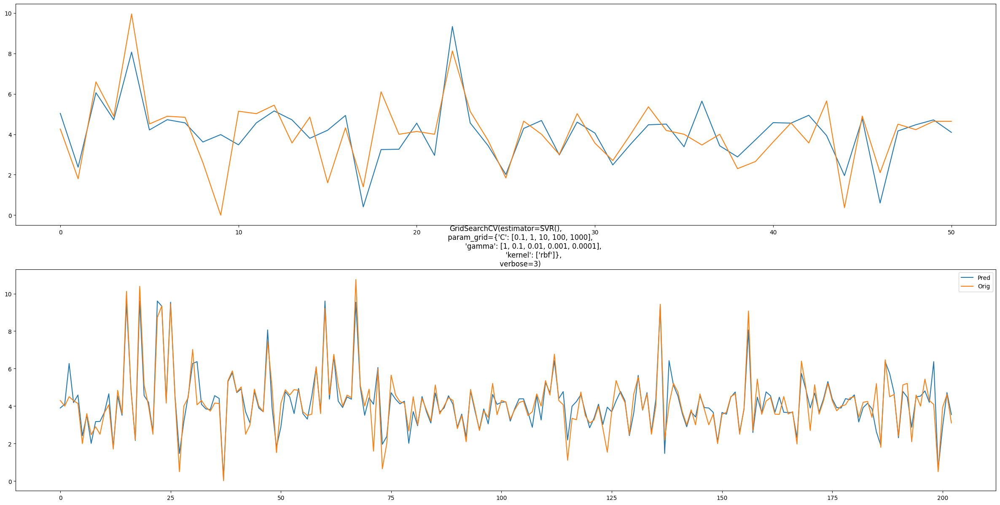

In [561]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.008 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.065 total time=   0.0s
[CV 3/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.325 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.142 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.107 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.038 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.015 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.208 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.019 total time=   0.0s
[CV 5/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.013 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.051 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

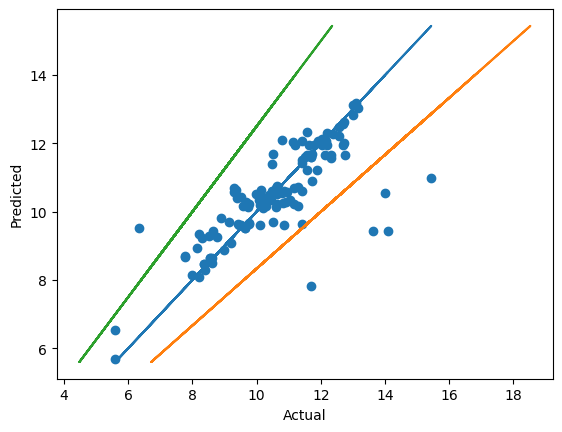

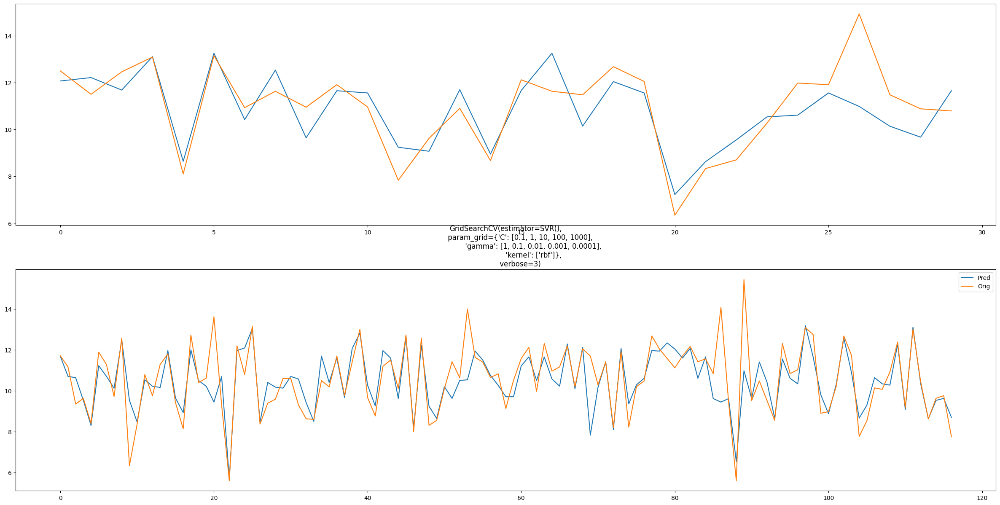

In [562]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### XGBoost

Actual: ['35.00 55.30 38.00 48.85 37.00']
Predicted: [34.85556  57.576397 38.550953 49.44787  36.76485 ]
Train r2:  0.9571877215528891
Train MAE:  1.653209843294961
Train RMSE:  3.8867721285609926
Test r2:  0.3136708533711594
Test MAE:  8.896679342542377
Test RMSE:  11.990759671847938
Scatter Index: 7.601212716290563
K Fold MAE: 10.75433801181197


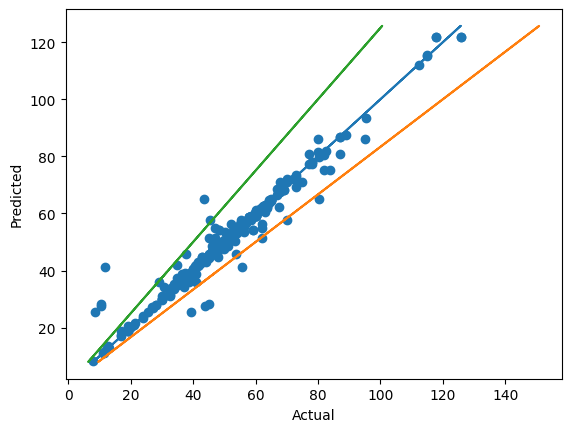

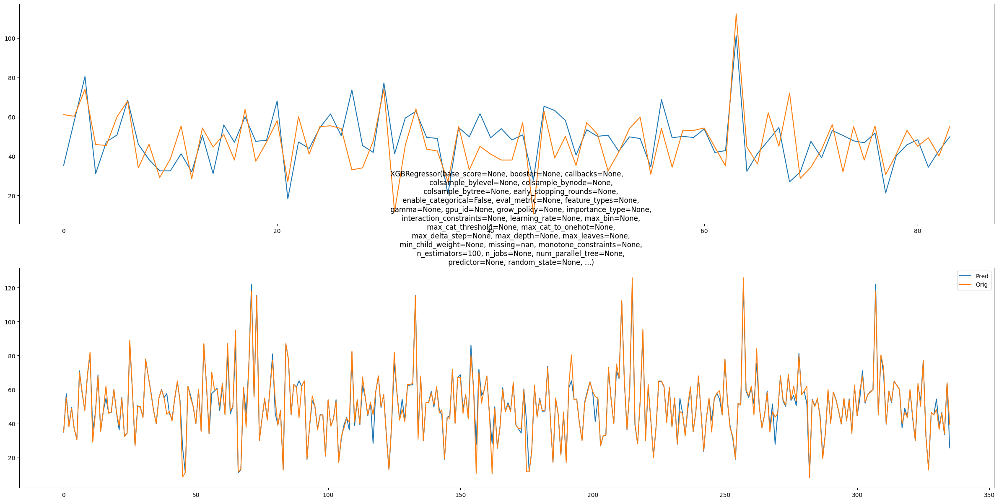

In [563]:
from xgboost import XGBRegressor
model = XGBRegressor()
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Actual: ['4.30 4.00 4.50 4.29 4.14']
Predicted: [4.1476703 4.0046854 5.76828   4.2739935 4.1484094]
Train r2:  0.9539401358145908
Train MAE:  0.14470569950533033
Train RMSE:  0.35367978849637627
Test r2:  0.5035223159049411
Test MAE:  0.7969736903788996
Test RMSE:  1.1915323519341867
Scatter Index: 8.431665315857128
K Fold MAE: 0.6901231243802279


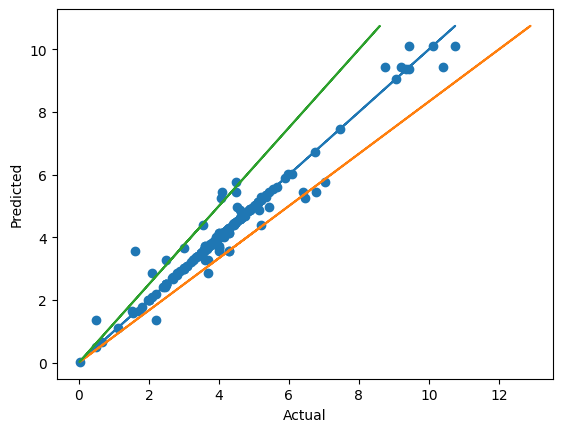

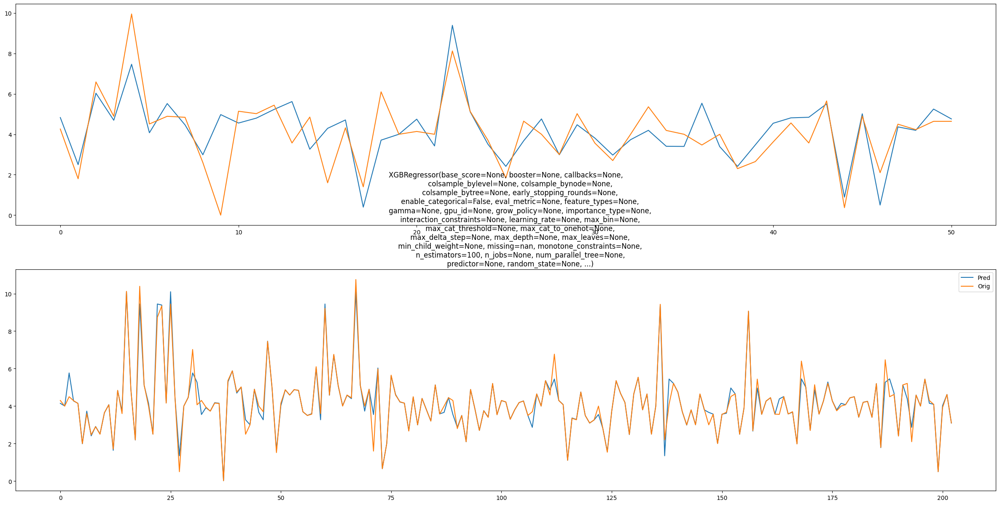

In [564]:
model = XGBRegressor()
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Actual: ['11.71 11.17  9.35  9.63  8.40']
Predicted: [11.710915 11.165946  9.747497  9.627349  8.399011]
Train r2:  0.9554517320319278
Train MAE:  0.1815831037668081
Train RMSE:  0.360779901788843
Test r2:  0.669464777746229
Test MAE:  0.8507378114064534
Test RMSE:  1.0425652712916647
Scatter Index: 3.4126130039276346
K Fold MAE: 0.9473851706947105


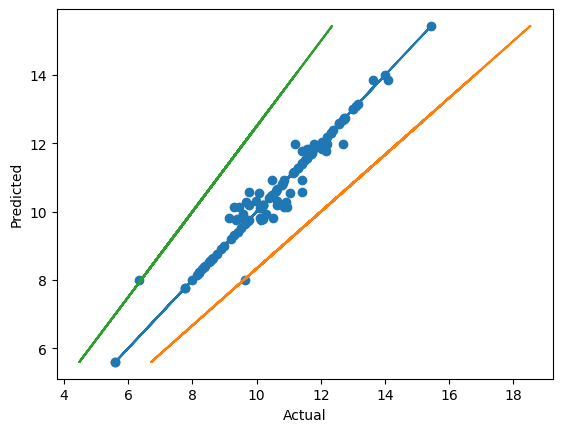

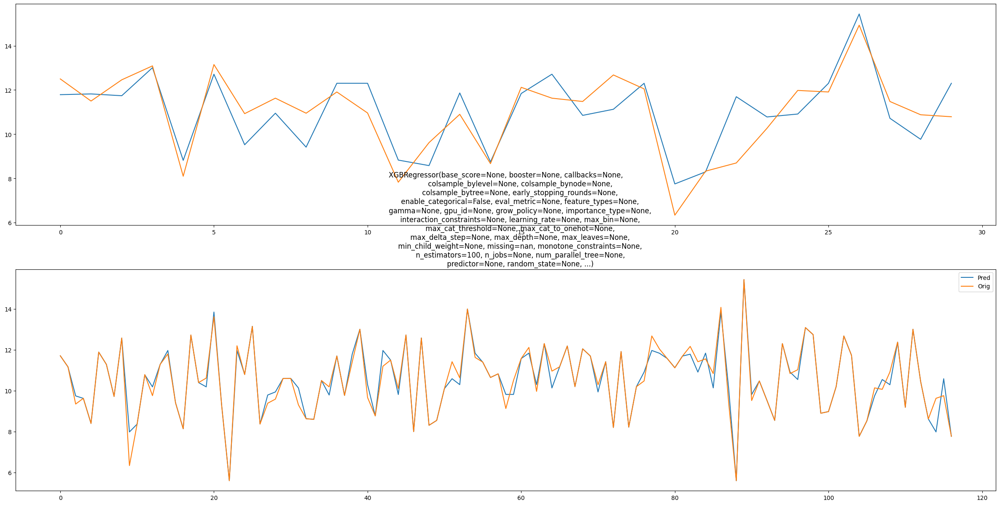

In [565]:
model = XGBRegressor()
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### ANN

Actual: ['35.00 55.30 38.00 48.85 37.00']
Predicted: [38.42628774 48.49200923 41.40142537 47.1035772  42.29529183]
Train r2:  0.43170921030097986
Train MAE:  10.208146663000377
Train RMSE:  14.160879194501264
Test r2:  0.33923973424828924
Test MAE:  8.860907844176111
Test RMSE:  11.76528459243369
Scatter Index: 27.507656851828134
K Fold MAE: 12.121490659571055


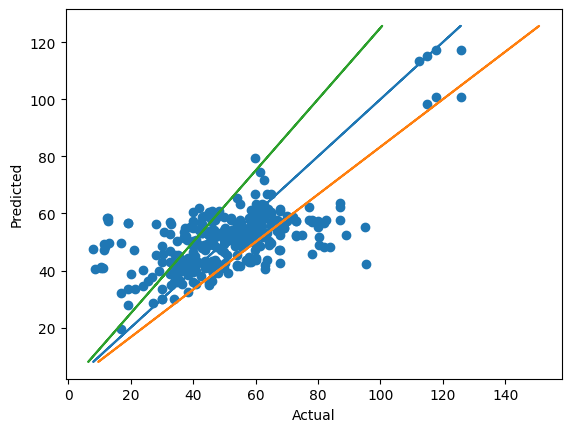

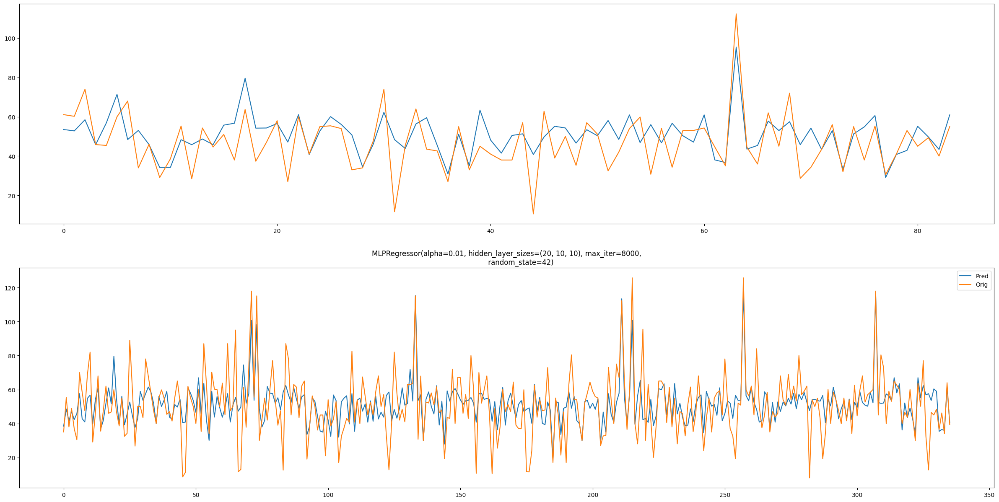

In [566]:
from sklearn.neural_network import MLPRegressor
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), alpha=0.01, random_state=42, max_iter=8000)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Actual: ['4.30 4.00 4.50 4.29 4.14']
Predicted: [3.87552021 3.95236896 5.50955107 3.71388225 4.48925169]
Train r2:  0.5852197864973739
Train MAE:  0.7578963248073932
Train RMSE:  1.0613483059895439
Test r2:  0.45893645215120327
Test MAE:  0.8726780573226973
Test RMSE:  1.2438846553692358
Scatter Index: 24.10430655658306
K Fold MAE: 0.739695733017178


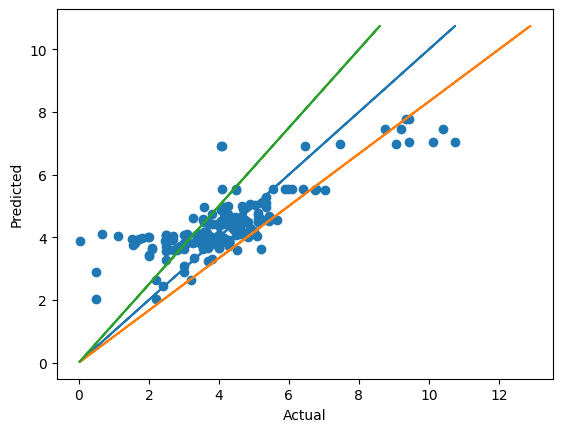

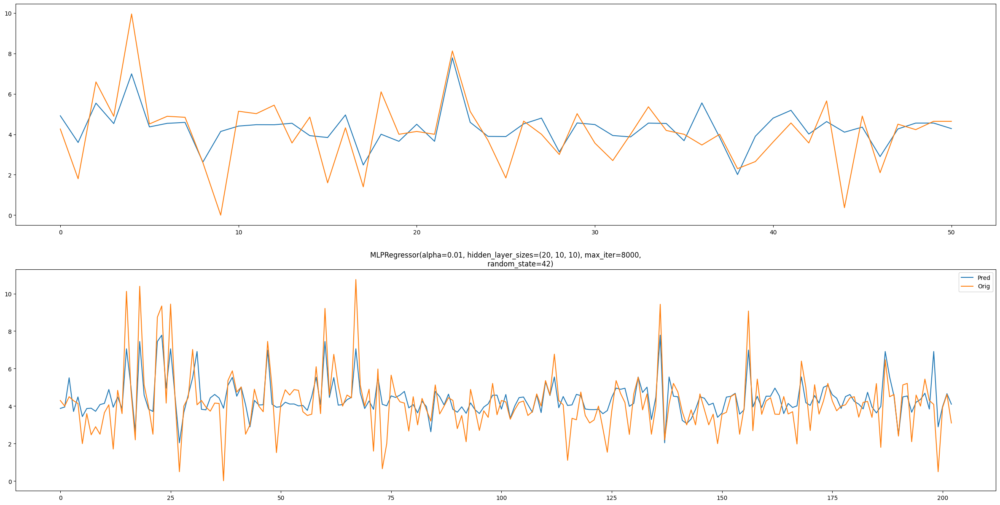

In [567]:
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), alpha=0.01, random_state=42, max_iter=8000)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Actual: ['11.71 11.17  9.35  9.63  8.40']
Predicted: [12.02064163 10.67718021 10.48687533  9.56539057  8.61981692]
Train r2:  0.7026090467989226
Train MAE:  0.6661088037577138
Train RMSE:  0.932160725095037
Test r2:  0.6651868292743486
Test MAE:  0.8638988468285567
Test RMSE:  1.0492902764371028
Scatter Index: 8.791660340583277
K Fold MAE: 1.0877516742845101


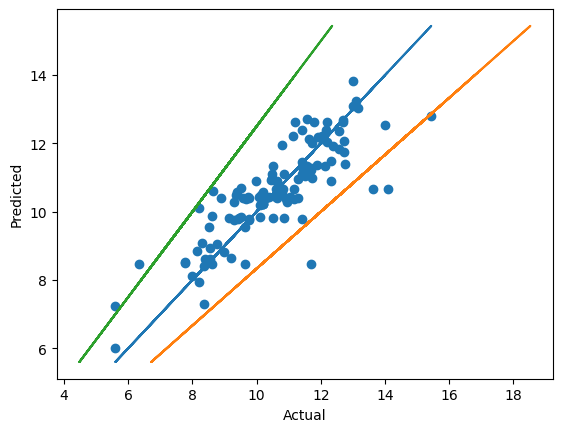

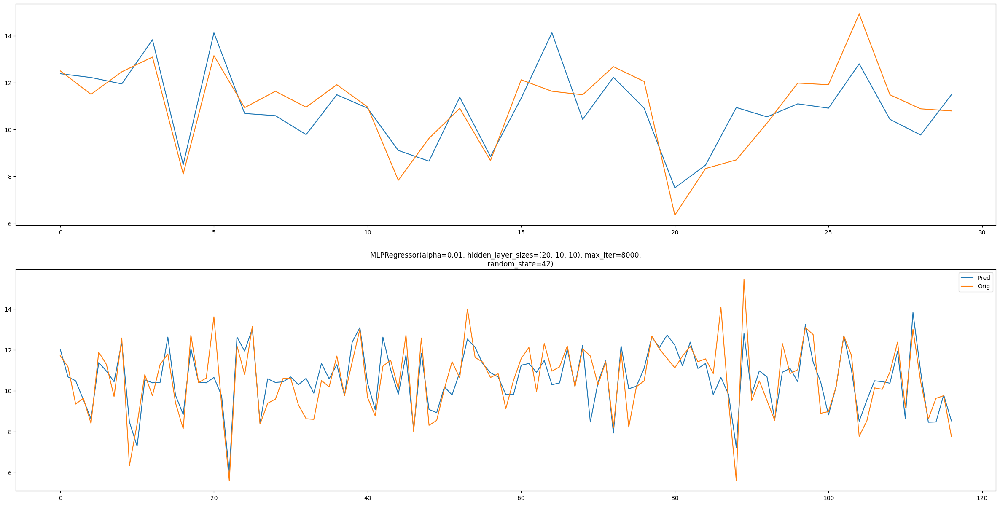

In [568]:
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), alpha=0.01, random_state=42, max_iter=8000)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

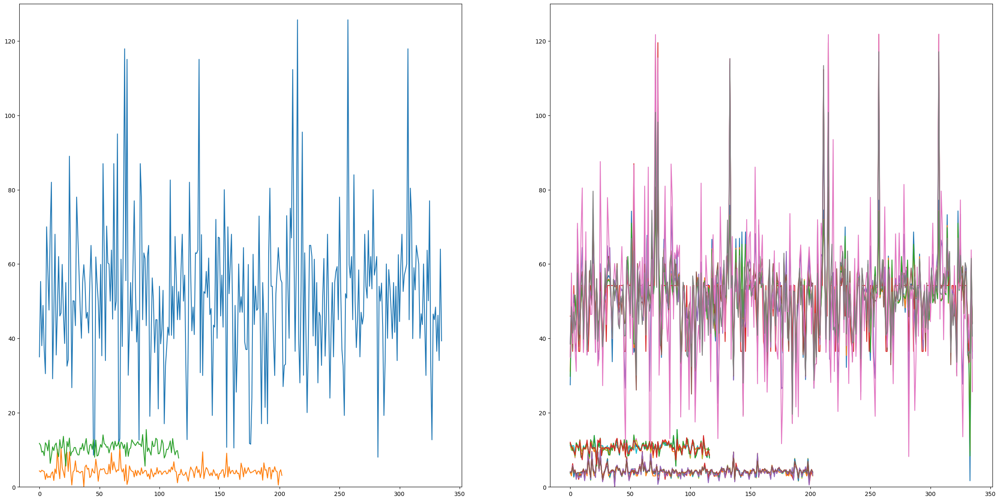

In [574]:
fig, ax = plt.subplots(1, 2)
fig.set_figheight(15)
fig.set_figwidth(30)
ax[0].set_ylim((0, 130))
ax[1].set_ylim((0, 130))
ax[0].plot(range(len(cs_y_train)), cs_y_train, label='CS')
ax[0].plot(range(len(ts_y_train)), ts_y_train, label='TS')
ax[0].plot(range(len(fs_y_train)), fs_y_train, label='FS')
for k1 in final_preds.keys():
    for k2 in range(len(final_preds[k1])):
        for k in final_preds[k1][k2].keys():
            ax[1].plot(range(len(final_preds[k1][k2][k])), final_preds[k1][k2][k])

In [570]:
df_cs = pd.DataFrame()
for k1 in range(len(final_preds['CS'])):
        df = pd.DataFrame.from_dict(final_preds['CS'][k1])
        df_cs = pd.concat([df_cs, df], axis=1)
df_cs = pd.concat([df_cs, train_cs], axis=1)

df_ts = pd.DataFrame()
for k1 in range(len(final_preds['TS'])):
        df = pd.DataFrame.from_dict(final_preds['TS'][k1])
        df_ts = pd.concat([df_ts, df], axis=1)
df_ts = pd.concat([df_ts, train_ts], axis=1)

df_fs = pd.DataFrame()
for k1 in range(len(final_preds['FS'])):
        df = pd.DataFrame.from_dict(final_preds['FS'][k1])
        df_fs = pd.concat([df_fs, df], axis=1)
df_fs = pd.concat([df_fs, train_fs], axis=1)
df_fs.columns        

Index(['LinearRegression()', 'Ridge(alpha=0.5)', 'Lasso(alpha=0.001)',
       'DecisionTreeRegressor(max_depth=4)',
       'RandomForestRegressor(max_depth=7)',
       'GridSearchCV(estimator=SVR(),\n             param_grid={'C': [0.1, 1, 10, 100, 1000],\n                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],\n                         'kernel': ['rbf']},\n             verbose=3)',
       'XGBRegressor(base_score=None, booster=None, callbacks=None,\n             colsample_bylevel=None, colsample_bynode=None,\n             colsample_bytree=None, early_stopping_rounds=None,\n             enable_categorical=False, eval_metric=None, feature_types=None,\n             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,\n             interaction_constraints=None, learning_rate=None, max_bin=None,\n             max_cat_threshold=None, max_cat_to_onehot=None,\n             max_delta_step=None, max_depth=None, max_leaves=None,\n             min_child_weight=None, missing=na

In [571]:
df_cs.head()

,LinearRegression(),Ridge(alpha=0.5),Lasso(alpha=0.05),DecisionTreeRegressor(max_depth=4),RandomForestRegressor(max_depth=8),"GridSearchCV(estimator=SVR(),\n param_grid={'C': [0.1, 1, 10, 100, 1000],\n 'gamma': [1, 0.1, 0.01, 0.001, 0.0001],\n 'kernel': ['rbf']},\n verbose=3)","XGBRegressor(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, gpu_id=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=None, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=None, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n n_estimators=100, n_jobs=None, num_parallel_tree=None,\n predictor=None, random_state=None, ...)","MLPRegressor(alpha=0.01, hidden_layer_sizes=(20, 10, 10), max_iter=8000,\n random_state=42)",Actual
0,27.471133,31.092401,29.763954,45.967241,38.573471,35.099872,34.855560,38.426288,35.00
1,48.051887,48.347371,47.980978,45.967241,51.106581,51.713769,57.576397,48.492009,55.30
2,38.718202,39.375263,39.691741,36.460154,39.828970,36.945309,38.550953,41.401425,38.00
3,46.853816,46.782441,46.110973,54.199761,51.884391,47.970706,49.447868,47.103577,48.85
4,51.183185,51.680863,51.595743,39.116364,38.464130,43.617155,36.764851,42.295292,37.00


In [572]:
df_cs.to_excel('Results_CS.xlsx', index=False)
df_ts.to_excel('Results_TS.xlsx', index=False)
df_fs.to_excel('Results_FS.xlsx', index=False)